In [1]:
import sys
!{sys.executable} -m pip -q install palantir fa2


[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: pip install --upgrade pip


In [2]:
import warnings
warnings.filterwarnings("ignore")
from anndata import AnnData
import numpy as np
import pandas as pd
import scanpy as sc
import scFates as scf
import palantir
import matplotlib.pyplot as plt
sc.settings.verbosity = 3
sc.settings.logfile = sys.stdout
## fix palantir breaking down some plots
import seaborn
seaborn.reset_orig()
%matplotlib inline

sc.set_figure_params()
scf.set_figure_pubready()

findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.


In [3]:
NF1 = sc.read_h5ad("/mnt/g/NF1.h5ad")

In [4]:
NF1

AnnData object with n_obs × n_vars = 74835 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample_id', 'group_id', 'percent.mt', 'percent.ribo', 'pANN_0.25_0.005_666', 'DF.classifications_0.25_0.005_666', 'doublet', 'pANN_0.25_0.005_674', 'DF.classifications_0.25_0.005_674', 'pANN_0.25_0.005_532', 'DF.classifications_0.25_0.005_532', 'pANN_0.25_0.005_499', 'DF.classifications_0.25_0.005_499', 'pANN_0.25_0.005_596', 'DF.classifications_0.25_0.005_596', 'pANN_0.25_0.005_760', 'DF.classifications_0.25_0.005_760', 'pANN_0.25_0.01_406', 'DF.classifications_0.25_0.01_406', 'pANN_0.25_0.005_452', 'DF.classifications_0.25_0.005_452', 'pANN_0.25_0.005_466', 'DF.classifications_0.25_0.005_466', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.1', 'seurat_clusters', 'SCT_snn_res.3', 'SCT_snn_res.2.5', 'SCT_snn_res.1.5', 'my_annotation_2'
    var: 'features'
    uns: 'neighbors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances'

In [6]:
sc.pp.filter_genes(NF1,min_cells=3)
sc.pp.normalize_total(NF1)
sc.pp.log1p(NF1,base=10)
sc.pp.highly_variable_genes(NF1)

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


ValueError: Bin edges must be unique: array([nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan]).
You can drop duplicate edges by setting the 'duplicates' kwarg

In [8]:
NF1.var

,features,n_cells
Xkr4,Xkr4,34467
Gm37381,Gm37381,41508
Sox17,Sox17,40206
Rgs20,Rgs20,48686
St18,St18,10922
...,...,...
AC133103.1,AC133103.1,41709
Cd209a,Cd209a,40789
Fam50b,Fam50b,41135
Gm42375,Gm42375,41514


In [12]:

pca_projections = pd.DataFrame(NF1.obsm["X_pca"],index=NF1.obs_names)

In [13]:
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=4)

Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:37)


In [14]:
# generate neighbor draph in multiscale diffusion space
NF1.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(NF1,n_neighbors=30,use_rep="X_palantir")

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:14)


In [15]:
NF1.obsm["X_pca2d"]=NF1.obsm["X_pca"][:,:2]
sc.tl.draw_graph(NF1,init_pos='X_pca2d') 

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:14:16)


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial


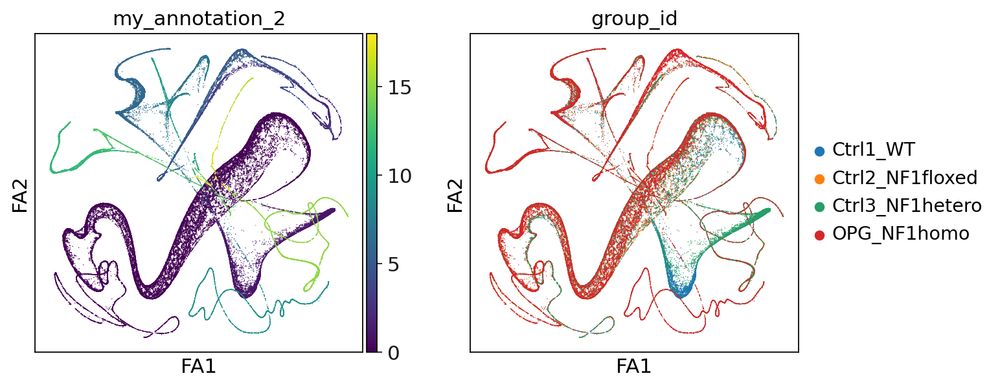

In [16]:
sc.pl.draw_graph(NF1,color=["my_annotation_2",'group_id']) #PCA-based, n_neighbors = 30, n_eigs = 4

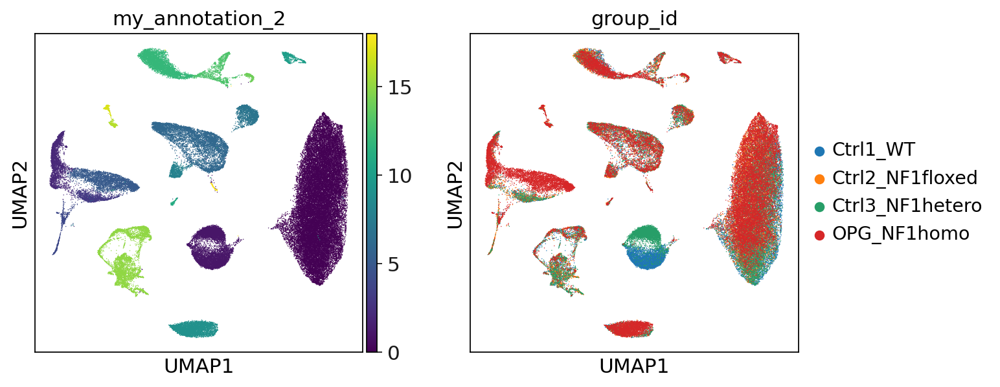

In [17]:
sc.pl.umap(NF1,color=["my_annotation_2",'group_id']) #PCA-based, n_neighbors = 30, n_eigs = 4

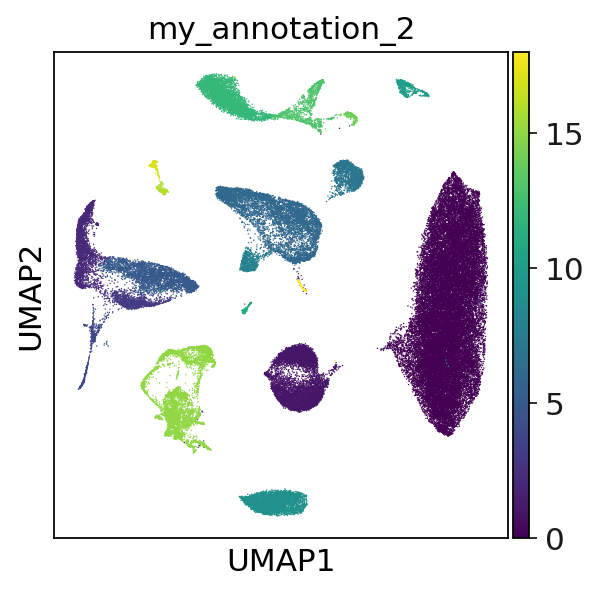

In [23]:
sc.pl.umap(NF1, color=["my_annotation_2"])

In [27]:
sc.tl.leiden(NF1)

running Leiden clustering
    finished: found 88 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:26)


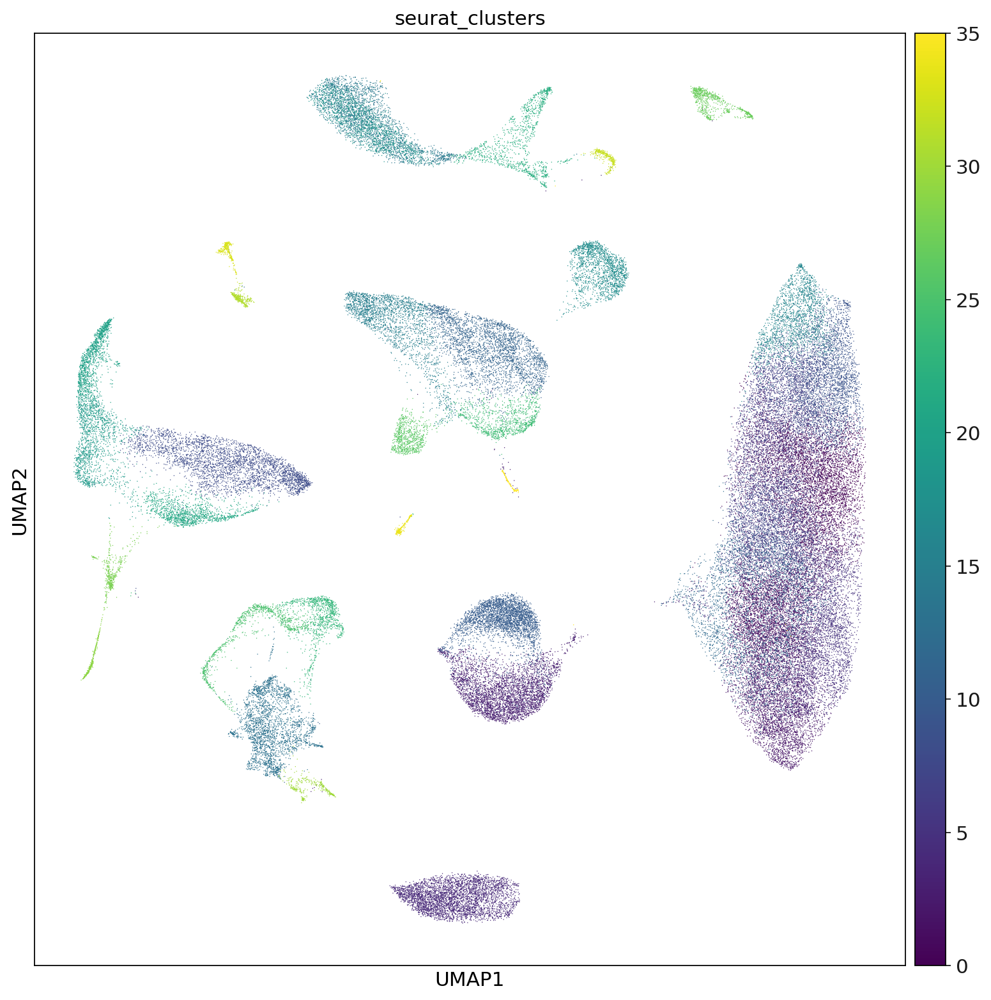

In [32]:
sc.set_figure_params(figsize = [12,12])
sc.pl.umap(NF1, color=["seurat_clusters"], legend_loc = 'on data')

In [18]:
NF1_test = NF1

In [19]:
sc.pp.neighbors(NF1_test,n_neighbors=50,use_rep="X_palantir")

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:35)


In [20]:
NF1_test.obsm["X_pca2d"]=NF1_test.obsm["X_pca"][:,:2]
sc.tl.draw_graph(NF1_test,init_pos='X_pca2d') 

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:16:11)


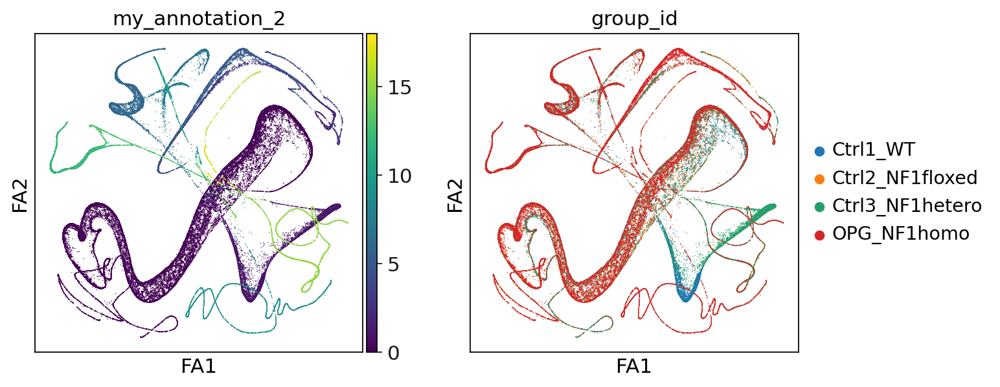

In [21]:
sc.pl.draw_graph(NF1_test,color=["my_annotation_2",'group_id']) #PCA-based, n_neighbors = 30, n_eigs = 4

In [52]:
NF1_Ctrl_WT = NF1[NF1.obs['group_id'].isin(['Ctrl1_WT'])]
NF1_Ctrl_NFflox = NF1[NF1.obs['group_id'].isin(['Ctrl2_NF1floxed'])]
NF1_Ctrl_NFhetero = NF1[NF1.obs['group_id'].isin(['Ctrl3_NF1hetero'])]
NF1_OPG_NFhomo = NF1[NF1.obs['group_id'].isin(['OPG_NF1homo'])]

In [33]:
NF1_obs = pd.read_csv(r"//mnt//g//NF1_metadata.csv")

In [34]:
NF1_obs

,Unnamed: 0,orig.ident,nCount_RNA,nFeature_RNA,sample_id,group_id,percent.mt,percent.ribo,pANN_0.25_0.005_666,DF.classifications_0.25_0.005_666,...,pANN_0.25_0.005_466,DF.classifications_0.25_0.005_466,nCount_SCT,nFeature_SCT,SCT_snn_res.1,seurat_clusters,SCT_snn_res.3,SCT_snn_res.2.5,SCT_snn_res.1.5,my_annotation_2
0,AAACCCAAGCGTGCTC-1_1,Ctrl1_WT_sample1,3912,1767,Ctrl1_WT_s1,Ctrl1_WT,0.025562,0.562372,0.00000,Singlet,...,NaN,NaN,3921,1767,8,2,4,7,2,Olig_1
1,AAACCCAAGTAGTGCG-1_1,Ctrl1_WT_sample1,1909,1139,Ctrl1_WT_s1,Ctrl1_WT,0.209534,0.838135,0.00000,Singlet,...,NaN,NaN,3546,1139,1,12,18,16,12,Olig_1
2,AAACCCACAACTGATC-1_1,Ctrl1_WT_sample1,4067,2685,Ctrl1_WT_s1,Ctrl1_WT,0.221293,2.532579,0.00000,Singlet,...,NaN,NaN,4061,2685,5,3,2,6,3,Olig_2
3,AAACCCACAAGAATAC-1_1,Ctrl1_WT_sample1,3233,1503,Ctrl1_WT_s1,Ctrl1_WT,0.092793,0.804207,0.00000,Singlet,...,NaN,NaN,3563,1503,1,12,7,16,12,Olig_1
4,AAACCCACAGCGATTT-1_1,Ctrl1_WT_sample1,3202,1690,Ctrl1_WT_s1,Ctrl1_WT,0.000000,1.561524,0.04918,Singlet,...,NaN,NaN,3510,1690,0,0,10,19,0,Olig_1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74830,TTTGTTGCAGCATTGT-1_10,OPG_NF1homo_sample4,3102,1562,OPG_NF1homo_s4,OPG_NF1homo,0.000000,0.548034,NaN,NaN,...,0.000000,Singlet,3489,1562,0,9,5,3,9,Olig_1
74831,TTTGTTGGTCGATGCC-1_10,OPG_NF1homo_sample4,4744,2015,OPG_NF1homo_s4,OPG_NF1homo,0.042159,0.274030,NaN,NaN,...,0.000000,Singlet,4381,2015,0,0,5,0,0,Olig_1
74832,TTTGTTGGTTCTAACG-1_10,OPG_NF1homo_sample4,3148,1832,OPG_NF1homo_s4,OPG_NF1homo,0.063532,0.508259,NaN,NaN,...,0.000000,Singlet,3427,1832,6,18,15,20,18,Microglia
74833,TTTGTTGGTTGAATCC-1_10,OPG_NF1homo_sample4,4110,2002,OPG_NF1homo_s4,OPG_NF1homo,0.000000,0.413625,NaN,NaN,...,0.000000,Singlet,4082,2002,9,8,36,37,8,Astro_4


In [36]:
NF1_obs = NF1_obs.rename(columns = {'Unnamed: 0':'CellID'})

In [37]:
NF1_obs = NF1_obs.set_index('CellID')

In [38]:
NF1_obs 

,orig.ident,nCount_RNA,nFeature_RNA,sample_id,group_id,percent.mt,percent.ribo,pANN_0.25_0.005_666,DF.classifications_0.25_0.005_666,doublet,...,pANN_0.25_0.005_466,DF.classifications_0.25_0.005_466,nCount_SCT,nFeature_SCT,SCT_snn_res.1,seurat_clusters,SCT_snn_res.3,SCT_snn_res.2.5,SCT_snn_res.1.5,my_annotation_2
CellID,,,,,,,,,,,,,,,,,,,,,
AAACCCAAGCGTGCTC-1_1,Ctrl1_WT_sample1,3912,1767,Ctrl1_WT_s1,Ctrl1_WT,0.025562,0.562372,0.00000,Singlet,Singlet,...,NaN,NaN,3921,1767,8,2,4,7,2,Olig_1
AAACCCAAGTAGTGCG-1_1,Ctrl1_WT_sample1,1909,1139,Ctrl1_WT_s1,Ctrl1_WT,0.209534,0.838135,0.00000,Singlet,Singlet,...,NaN,NaN,3546,1139,1,12,18,16,12,Olig_1
AAACCCACAACTGATC-1_1,Ctrl1_WT_sample1,4067,2685,Ctrl1_WT_s1,Ctrl1_WT,0.221293,2.532579,0.00000,Singlet,Singlet,...,NaN,NaN,4061,2685,5,3,2,6,3,Olig_2
AAACCCACAAGAATAC-1_1,Ctrl1_WT_sample1,3233,1503,Ctrl1_WT_s1,Ctrl1_WT,0.092793,0.804207,0.00000,Singlet,Singlet,...,NaN,NaN,3563,1503,1,12,7,16,12,Olig_1
AAACCCACAGCGATTT-1_1,Ctrl1_WT_sample1,3202,1690,Ctrl1_WT_s1,Ctrl1_WT,0.000000,1.561524,0.04918,Singlet,Singlet,...,NaN,NaN,3510,1690,0,0,10,19,0,Olig_1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGCAGCATTGT-1_10,OPG_NF1homo_sample4,3102,1562,OPG_NF1homo_s4,OPG_NF1homo,0.000000,0.548034,NaN,NaN,Singlet,...,0.000000,Singlet,3489,1562,0,9,5,3,9,Olig_1
TTTGTTGGTCGATGCC-1_10,OPG_NF1homo_sample4,4744,2015,OPG_NF1homo_s4,OPG_NF1homo,0.042159,0.274030,NaN,NaN,Singlet,...,0.000000,Singlet,4381,2015,0,0,5,0,0,Olig_1
TTTGTTGGTTCTAACG-1_10,OPG_NF1homo_sample4,3148,1832,OPG_NF1homo_s4,OPG_NF1homo,0.063532,0.508259,NaN,NaN,Singlet,...,0.000000,Singlet,3427,1832,6,18,15,20,18,Microglia


In [39]:
NF1.obs['labels_SCT'] = NF1_obs['my_annotation_2']

In [40]:
NF1.obs

,orig.ident,nCount_RNA,nFeature_RNA,sample_id,group_id,percent.mt,percent.ribo,pANN_0.25_0.005_666,DF.classifications_0.25_0.005_666,doublet,...,nCount_SCT,nFeature_SCT,SCT_snn_res.1,seurat_clusters,SCT_snn_res.3,SCT_snn_res.2.5,SCT_snn_res.1.5,my_annotation_2,leiden,labels_SCT
AAACCCAAGCGTGCTC-1_1,Ctrl1_WT_sample1,3912.0,1767,Ctrl1_WT_s1,Ctrl1_WT,0.025562,0.562372,0.00000,Singlet,Singlet,...,3921.0,1767,8,2,4,7,2,0,68,Olig_1
AAACCCAAGTAGTGCG-1_1,Ctrl1_WT_sample1,1909.0,1139,Ctrl1_WT_s1,Ctrl1_WT,0.209534,0.838135,0.00000,Singlet,Singlet,...,3546.0,1139,1,12,18,16,12,0,19,Olig_1
AAACCCACAACTGATC-1_1,Ctrl1_WT_sample1,4067.0,2685,Ctrl1_WT_s1,Ctrl1_WT,0.221293,2.532579,0.00000,Singlet,Singlet,...,4061.0,2685,5,3,2,6,3,1,4,Olig_2
AAACCCACAAGAATAC-1_1,Ctrl1_WT_sample1,3233.0,1503,Ctrl1_WT_s1,Ctrl1_WT,0.092793,0.804207,0.00000,Singlet,Singlet,...,3563.0,1503,1,12,7,16,12,0,12,Olig_1
AAACCCACAGCGATTT-1_1,Ctrl1_WT_sample1,3202.0,1690,Ctrl1_WT_s1,Ctrl1_WT,0.000000,1.561524,0.04918,Singlet,Singlet,...,3510.0,1690,0,0,10,19,0,0,19,Olig_1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGCAGCATTGT-1_10,OPG_NF1homo_sample4,3102.0,1562,OPG_NF1homo_s4,OPG_NF1homo,0.000000,0.548034,NaN,NA,Singlet,...,3489.0,1562,0,9,5,3,9,0,0,Olig_1
TTTGTTGGTCGATGCC-1_10,OPG_NF1homo_sample4,4744.0,2015,OPG_NF1homo_s4,OPG_NF1homo,0.042159,0.274030,NaN,NA,Singlet,...,4381.0,2015,0,0,5,0,0,0,3,Olig_1
TTTGTTGGTTCTAACG-1_10,OPG_NF1homo_sample4,3148.0,1832,OPG_NF1homo_s4,OPG_NF1homo,0.063532,0.508259,NaN,NA,Singlet,...,3427.0,1832,6,18,15,20,18,12,32,Microglia
TTTGTTGGTTGAATCC-1_10,OPG_NF1homo_sample4,4110.0,2002,OPG_NF1homo_s4,OPG_NF1homo,0.000000,0.413625,NaN,NA,Singlet,...,4082.0,2002,9,8,36,37,8,5,39,Astro_4


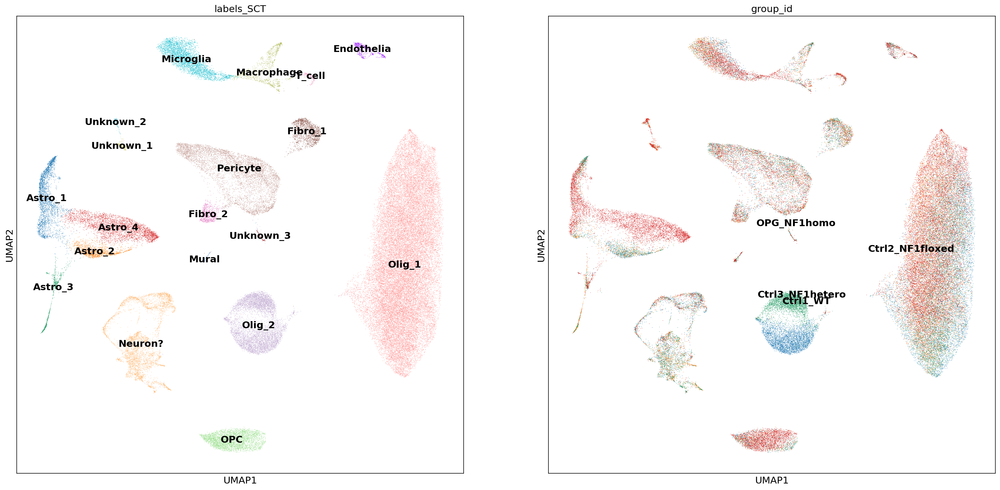

In [42]:
sc.pl.umap(NF1,color=["labels_SCT",'group_id'], legend_loc = 'on data')

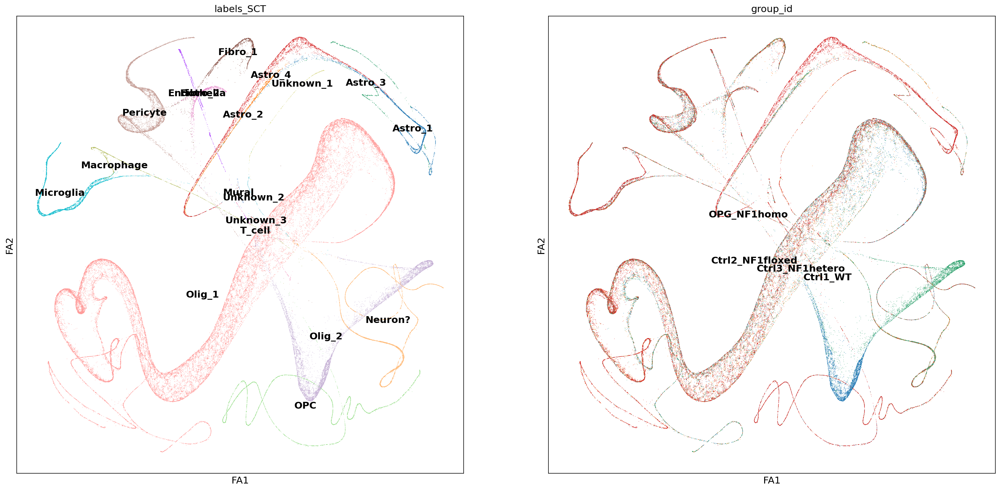

In [43]:
sc.pl.draw_graph(NF1,color=["labels_SCT",'group_id'], legend_loc = 'on data') #PCA-based, n_neighbors = 30, n_eigs = 4

In [44]:
astrocytes = NF1[NF1.obs['labels_SCT'].isin(['Astro_1','Astro_2','Astro_3','Astro_4'])]

In [46]:

pca_projections = pd.DataFrame(astrocytes.obsm["X_pca"],index=astrocytes.obs_names)
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=4)
astrocytes.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(astrocytes,n_neighbors=30,use_rep="X_palantir")

Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)


In [47]:
astrocytes.obsm["X_pca2d"]=astrocytes.obsm["X_pca"][:,:2]
sc.tl.draw_graph(astrocytes,init_pos='X_pca2d')

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:56)


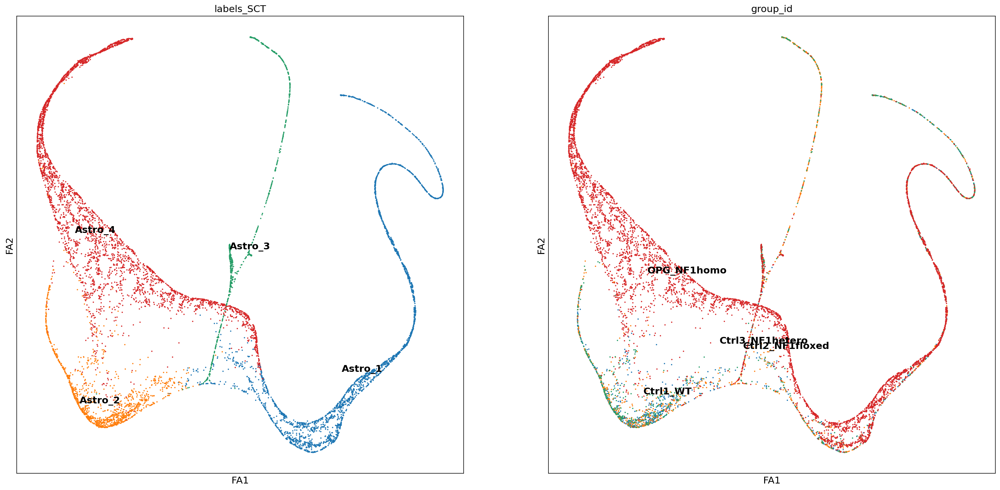

In [48]:
sc.pl.draw_graph(astrocytes,color=["labels_SCT",'group_id'], legend_loc = 'on data')

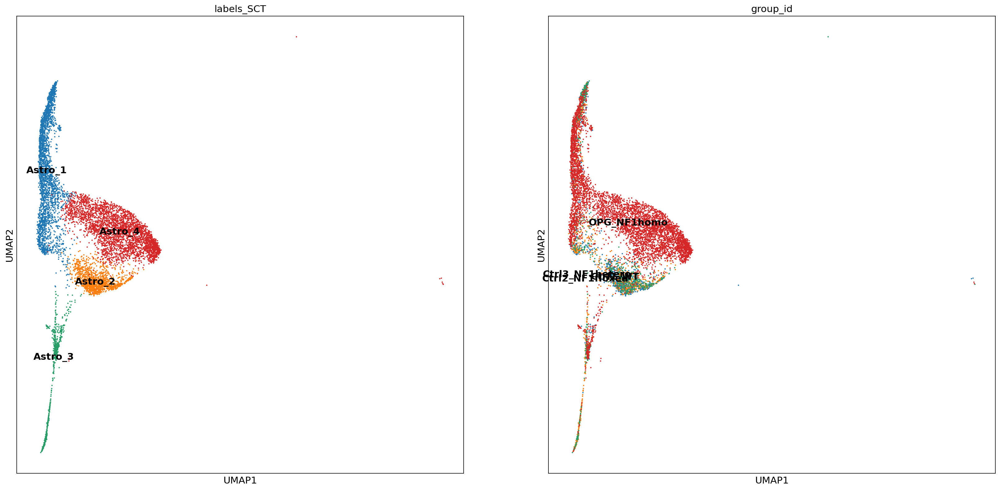

In [49]:
sc.pl.umap(astrocytes,color=["labels_SCT",'group_id'], legend_loc = 'on data')

In [50]:
sc.tl.umap(astrocytes)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:21)


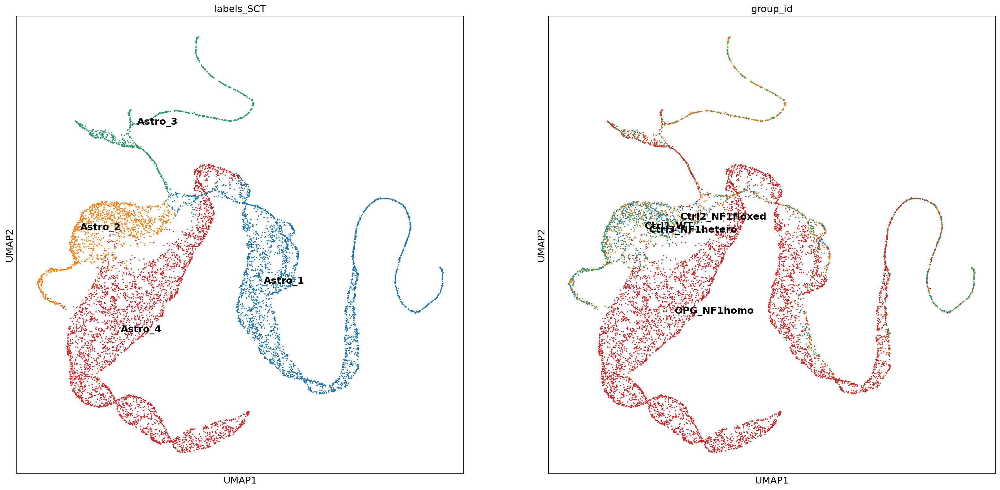

In [51]:
sc.pl.umap(astrocytes,color=["labels_SCT",'group_id'], legend_loc = 'on data')

In [53]:
def cluster_small_multiples(
    adata, clust_key, size=60, frameon=False, legend_loc=None, **kwargs
):
    tmp = adata.copy()

    for i, clust in enumerate(adata.obs[clust_key].cat.categories):
        tmp.obs[clust] = adata.obs[clust_key].isin([clust]).astype("category")
        tmp.uns[clust + "_colors"] = ["#d3d3d3", adata.uns[clust_key + "_colors"][i]]

    sc.pl.draw_graph(
        tmp,
        groups=tmp.obs[clust].cat.categories[1:].values,
        color=adata.obs[clust_key].cat.categories.tolist(),
        size=size,
        frameon=frameon,
        legend_loc=legend_loc,
        **kwargs,
    )

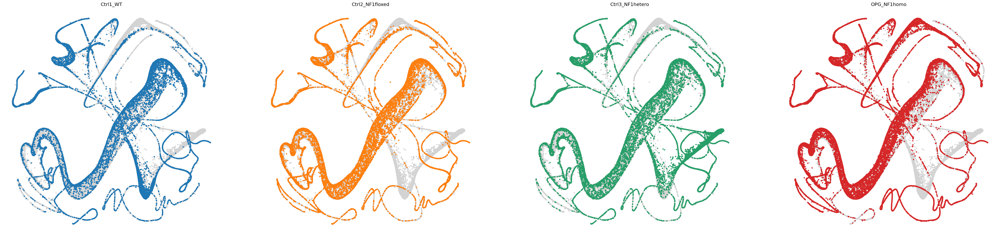

In [54]:
cluster_small_multiples(NF1, clust_key = 'group_id')

In [55]:
NF1_Ctrl_WT 
NF1_Ctrl_NFflox 
NF1_Ctrl_NFhetero
NF1_OPG_NFhomo 


View of AnnData object with n_obs × n_vars = 27566 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample_id', 'group_id', 'percent.mt', 'percent.ribo', 'pANN_0.25_0.005_666', 'DF.classifications_0.25_0.005_666', 'doublet', 'pANN_0.25_0.005_674', 'DF.classifications_0.25_0.005_674', 'pANN_0.25_0.005_532', 'DF.classifications_0.25_0.005_532', 'pANN_0.25_0.005_499', 'DF.classifications_0.25_0.005_499', 'pANN_0.25_0.005_596', 'DF.classifications_0.25_0.005_596', 'pANN_0.25_0.005_760', 'DF.classifications_0.25_0.005_760', 'pANN_0.25_0.01_406', 'DF.classifications_0.25_0.01_406', 'pANN_0.25_0.005_452', 'DF.classifications_0.25_0.005_452', 'pANN_0.25_0.005_466', 'DF.classifications_0.25_0.005_466', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.1', 'seurat_clusters', 'SCT_snn_res.3', 'SCT_snn_res.2.5', 'SCT_snn_res.1.5', 'my_annotation_2', 'leiden', 'labels_SCT'
    var: 'features', 'n_cells'
    uns: 'neighbors', 'log1p', 'draw_graph', 'group_id_colors', 'leiden', 'leiden_colors', 

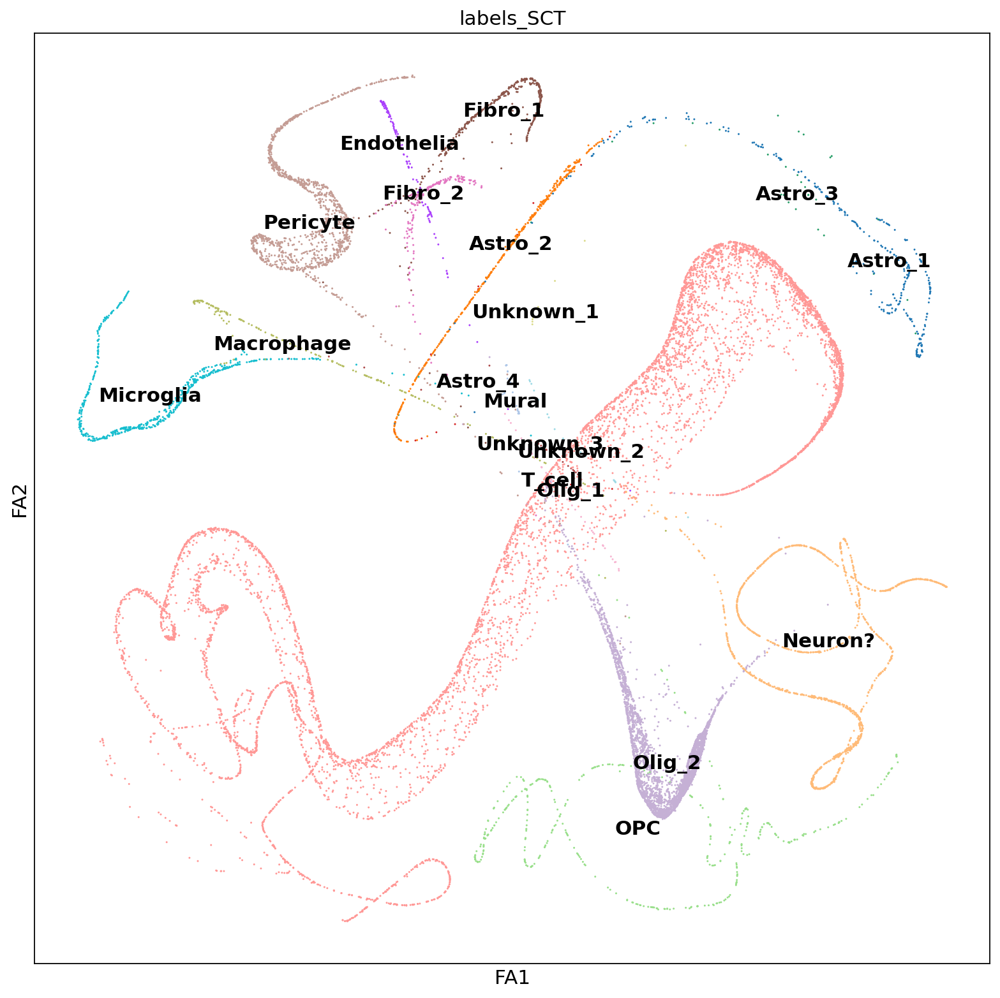

In [56]:
sc.pl.draw_graph(NF1_Ctrl_WT,color=["labels_SCT"], legend_loc = 'on data')

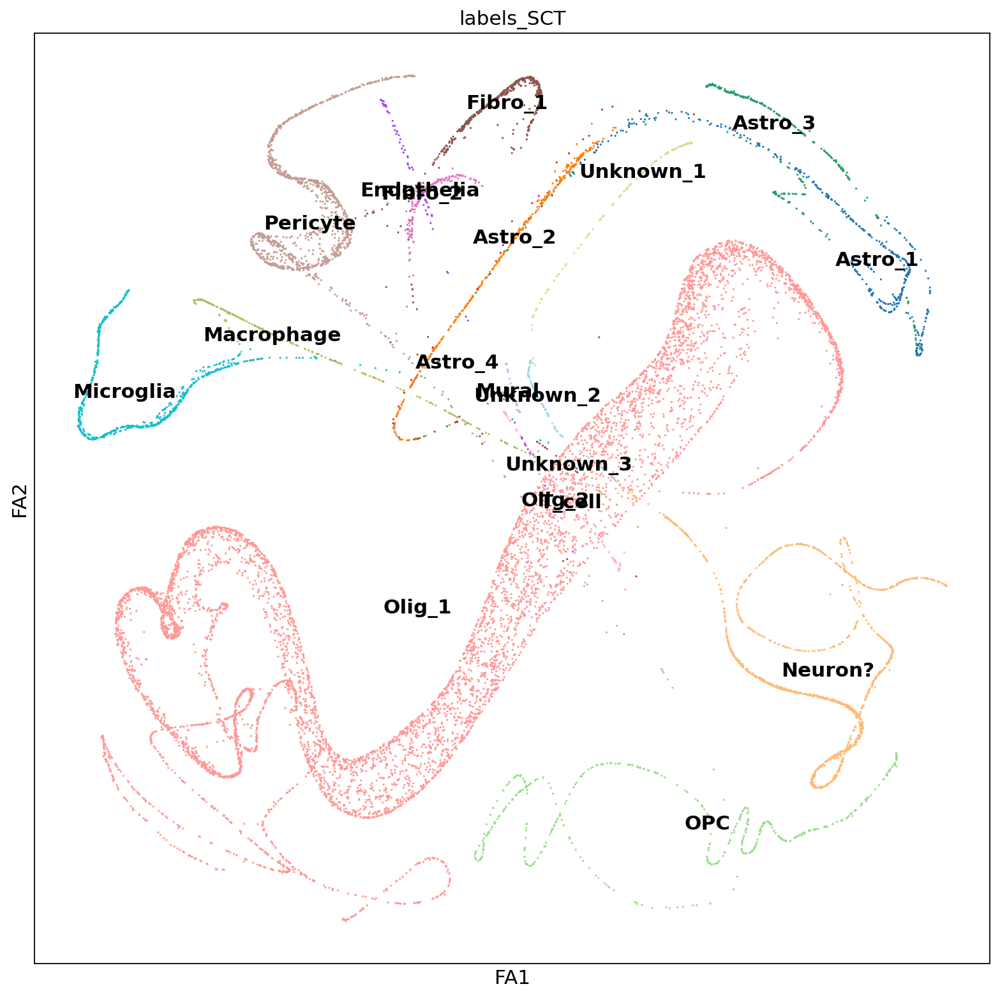

In [57]:
sc.pl.draw_graph(NF1_Ctrl_NFflox,color=["labels_SCT"], legend_loc = 'on data')

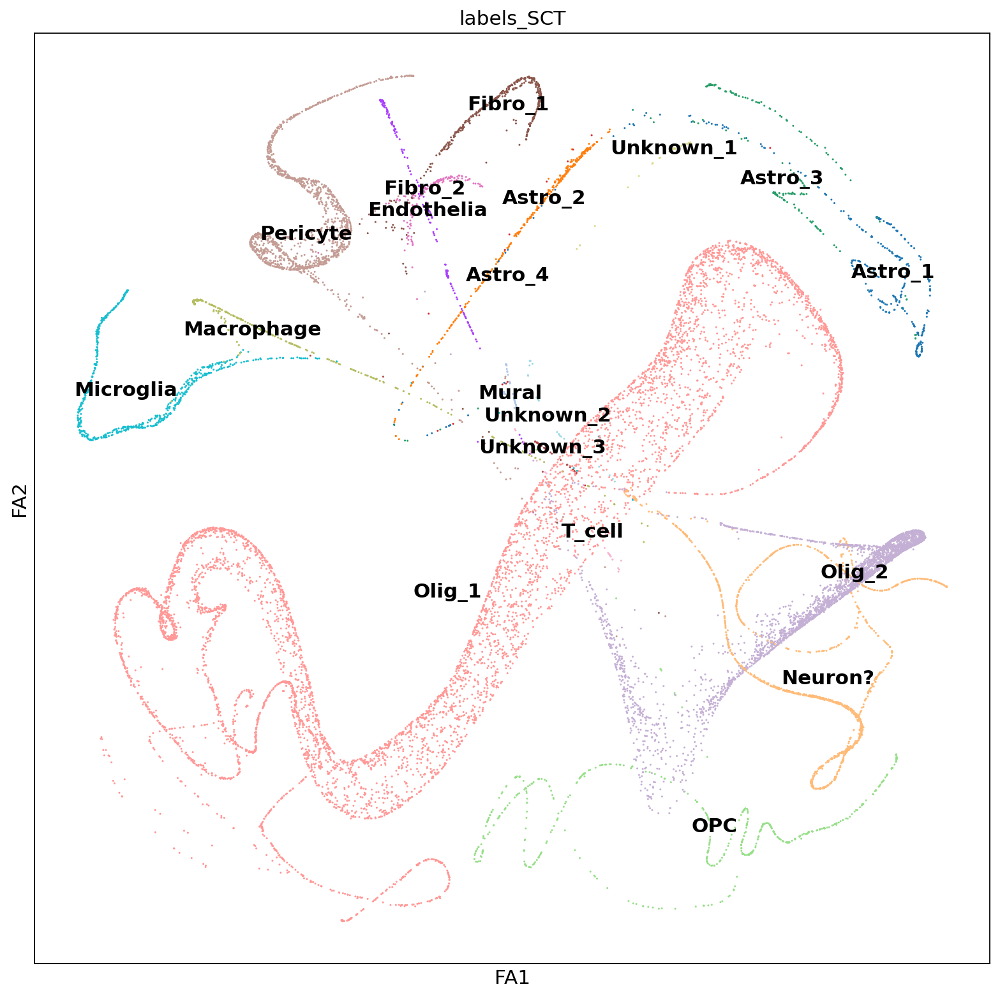

In [58]:
sc.pl.draw_graph(NF1_Ctrl_NFhetero,color=["labels_SCT"], legend_loc = 'on data')

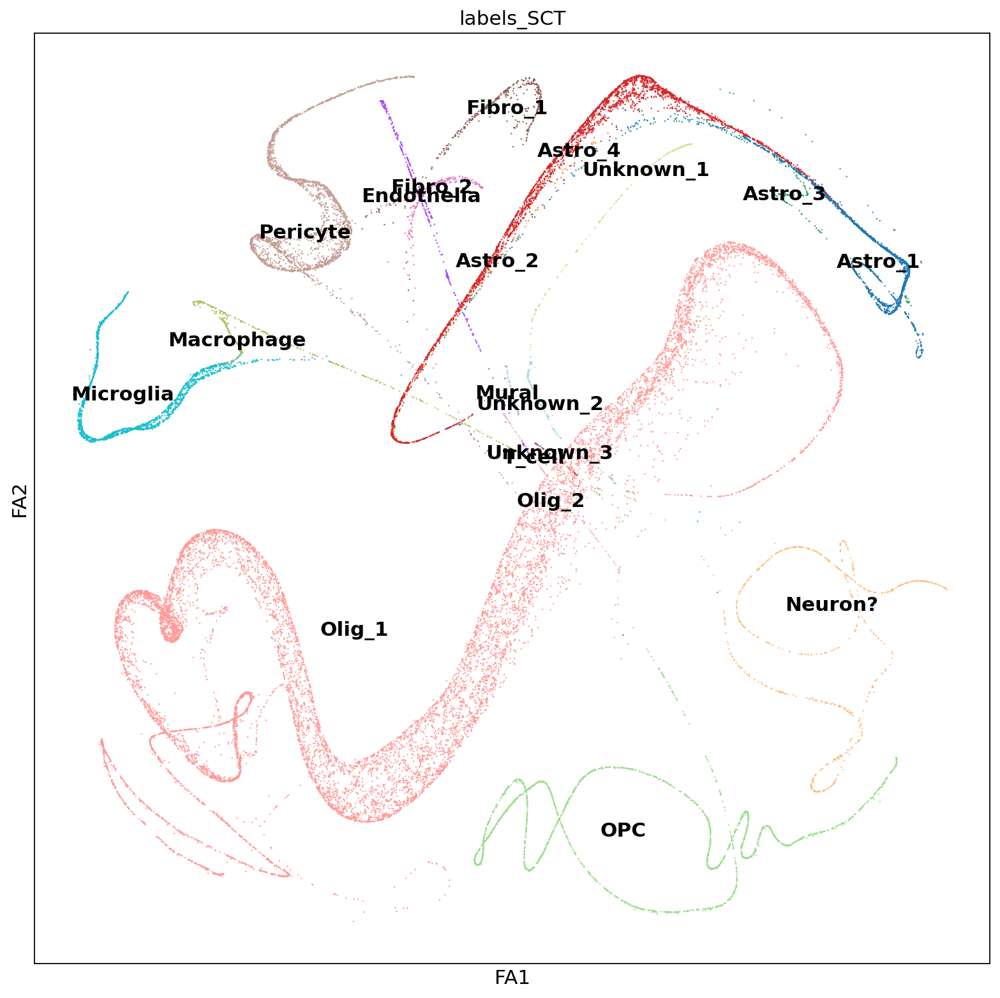

In [59]:
#NF1_OPG_NFhomo 
sc.pl.draw_graph(NF1_OPG_NFhomo,color=["labels_SCT"], legend_loc = 'on data')